# Домашнее задание по теме: "Логистическая регрессия и случайный лес".
Выполнил: Боровой Алексей Андреевич;\
Поток "Волнослушатели";\
2023г.


## Генерирование данных для выполнения задания.


Импорт необходимых библиотек:

In [34]:
from sklearn.datasets import make_classification
from sklearn.metrics import roc_auc_score, accuracy_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from scipy.stats import linregress
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

С помощью библиотеки sklearn генерируем датасет из 7000 наблюдений (20 фичей + 1 отклик).

In [21]:
X, y = make_classification(n_samples=7000, 
                           n_features=20, 
                           n_informative=5, 
                           n_redundant=2,
                           n_repeated=0, 
                           scale=None, 
                           shift=None, 
                           shuffle=False, 
                           class_sep=0.5, 
                           random_state=40) # Для возобновляемости генерации утвержден random_state = 40

Проверим, что получилось:

In [22]:
X # Набор фич (предикторы)

array([[ -46.27703798, -169.21189459,   89.41455746, ...,   15.02021747,
         108.42594097,   -8.57337909],
       [-222.86420981,   57.76047399,  -94.07359725, ...,  -27.79363818,
        -101.63752038,  -14.49759656],
       [ -67.43462504,   99.32916926,  -28.68500093, ...,   95.52818871,
          72.29888958,  -20.12499603],
       ...,
       [  26.18117951,  -69.88518654,  214.8991117 , ...,   64.93376315,
         -40.14575301,   -9.73012479],
       [ 219.71042753,  -16.9345571 ,  -66.06783171, ...,  -42.91514704,
           4.46556975,  -42.87531698],
       [ 329.47068704,    3.2297287 ,  118.52921956, ...,   23.12279768,
         -58.17951288,  -10.10903218]])

In [23]:
y # Отклик (двухклассовая классификация)

array([0, 0, 0, ..., 1, 1, 1])

Проверим информативность признаков (формула из лекции). Определим ROC AUC для каждого признака.

In [24]:
non_informative = []

for i in range(X.shape[1]):
    auc = roc_auc_score(y, X[:, i])
    if abs(auc - 0.5) < 0.02:
        print(f"{i} : {auc = :.3f} -> non_informative")
        non_informative.append(i)
    else:
        print(f"{i} : {auc = :.3f}")

0 : auc = 0.491 -> non_informative
1 : auc = 0.736
2 : auc = 0.708
3 : auc = 0.406
4 : auc = 0.502 -> non_informative
5 : auc = 0.471
6 : auc = 0.389
7 : auc = 0.490 -> non_informative
8 : auc = 0.508 -> non_informative
9 : auc = 0.507 -> non_informative
10 : auc = 0.502 -> non_informative
11 : auc = 0.501 -> non_informative
12 : auc = 0.495 -> non_informative
13 : auc = 0.500 -> non_informative
14 : auc = 0.486 -> non_informative
15 : auc = 0.504 -> non_informative
16 : auc = 0.501 -> non_informative
17 : auc = 0.514 -> non_informative
18 : auc = 0.500 -> non_informative
19 : auc = 0.502 -> non_informative


Результаты ожидаемы: Информативных признаков всего 5 (что логично, ибо в генерации датасета в качестве параметра количества информативных признаков было указано n_informative = 5).

## Задание 1.

Написать функцию woe_line:

1. разбить наблюдения на n_buckets групп по $X$
2. в каждой группе по y отложить WoE, по x медианное значение $X$
3. вывести полученный график
4. вывести ROC AUC признака (sklearn.metrics.roc_auc_score)
5. Опционально. Рассчитать доверительный интервал для bad rate (bad rate - доля наблюдений с целевой переменной =1 от всех наблюдений в группе)
6. Опционально. Нанести на график линейное приближение любым способом

График позволит проверить линейность зависимости, силу переменной, опционально проверить распределение

Скелет функции WoE:

In [25]:
def woe_line(X,         # 1-d array with independent feature 
             y,         # 1-d array with target feature
             n_buckets, # number of buckets to plot
             var_nm,    # optional, var_name to show above the plot
             target_nm, # optional, target_name to show above the plot
             plot_hist  # optional, if True — histogram of X is displayed
            ):
  pass

Сформируем функцию woe_line:

In [26]:
def woe_line(X, y, n_buckets, var_nm=None, target_nm=None, plot_hist=False):
    '''
  Функция строит график Weight of Evidence (WoE) фичи от отклика 
  и график линейной регрессии (линейное приближение).

  аргументы функции:

  Х - 1-мерный массив фичи (признака);
  y - 1-мерный массив отклика;
  n_buckets - количество бакетов (частей), на которые делится общее количество наблюдений;
  var_nm - наименование фичи для отображения на графике (опциональный);
  target_nm - наименование отклика для отображение на графике (опциональный);
  plot_hist - параметр вывода гистограммы фичи(True/False) (опциональный).
  '''
    # Формирование датасета из проверяемой фичи и отклика.
    df = pd.DataFrame({'X': X, 'y': y})

    # Сортировка по значениям фичи.
    df.sort_values('X', inplace=True)

    # Вычисление размера группы.
    bucket_size = len(X) // n_buckets

    # Создание пустых списков для сбора значений.
    bucket_medians = []
    bucket_woe = []
    bucket_bad_rate = []

    # Расчет значений для каждой группы (медиана и WoE).
    for i in range(n_buckets):
        start = i * bucket_size
        end = (i + 1) * bucket_size
        bucket = df.iloc[start:end]

        # Подсчет медианы.
        median = bucket['X'].median()
        bucket_medians.append(median)

        events = bucket['y'].sum() # Количество единиц в бакете.
        non_events = bucket['y'].count() - events # Количество нулей в бакете.

        # Условие проверки деления на ноль (чтобы избежать ситуации деления на ноль).
        if events == 0:
            events = 0.5
        if non_events == 0:
            non_events = 0.5

        # Подсчет WoE.
        woe = np.log(events / non_events)
        bucket_woe.append(woe)

        # Подсчет Bad_rate (для доверительного интервала).
        bad_rate = events / (events + non_events)
        bucket_bad_rate.append(bad_rate)
    
    # Расчет roc_auc фичи.
    roc_auc = roc_auc_score(y, X)

    # Линейное приближение (линейная регрессия).
    slope, intercept, _, _, _ = linregress(bucket_medians, bucket_woe)
    regression_line = [slope * x + intercept for x in bucket_medians]

    # Отрисовка графика WoE фичи.
    fig, ax = plt.subplots()
    ax.errorbar(bucket_medians, bucket_woe, linestyle='--', color='red', yerr=1.96 * np.sqrt(np.array(bucket_woe) * (1 - np.array(bucket_woe)) / np.array(bucket_size)), fmt='o', label='WoE')
    ax.plot(bucket_medians, regression_line, linestyle='-', color='blue', label='Interpolation')
    ax.set_xlabel('Feature value')
    ax.set_ylabel('WoE')

    # Если задано имя фичи:
    if var_nm:
        ax.set_title(f'WoE {var_nm} roc_auc: {round(roc_auc, 4)}')

    # Если задано имя отклика:
    if target_nm:
        ax.set_title(f'WoE {var_nm} | {target_nm} roc_auc: {round(roc_auc, 4)}')
    ax.legend()
    plt.show()

    # Отрисовка гистограммы Х в случае, если флаг plot_hist=True.
    if plot_hist:
        sns.histplot(df['X'], bins=n_buckets)
        plt.show()

    # Расчет доверительного интервала для bad rate.
    mean_bad_rate = np.mean(bucket_bad_rate)
    std_bad_rate = np.std(bucket_bad_rate)
    n = len(bucket_bad_rate)
    margin_error = 1.96 * (std_bad_rate / np.sqrt(n))
    lower_bound = mean_bad_rate - margin_error
    upper_bound = mean_bad_rate + margin_error

    # Вывод доверительного интервала для Bad Rate.
    print()
    print(f" Доверительный интервал для Bad Rate: [{lower_bound:.4f}, {upper_bound:.4f}]")
    return roc_auc

Протестируем функцию на второй фиче (X_1) для количества бакетов = 10 и выведем гистограмму:

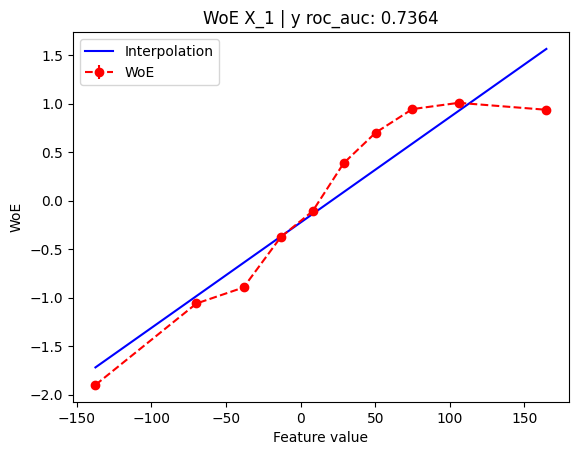

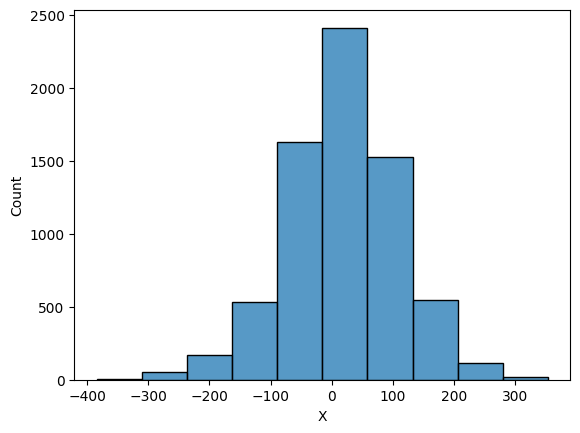


 Доверительный интервал для Bad Rate: [0.3697, 0.6289]


0.7364184008538792

In [27]:
woe_line(X[:, 1], y, n_buckets=10, var_nm='X_1', target_nm='y', plot_hist=True)

Проверим работу нашей функции сравнив ее с кастомной библиотекой risksutils.\
https://github.com/dshulchevskii/risksutils

In [28]:
import holoviews as hv
hv.extension('matplotlib')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

Необходимо доустановить библиотеку risksutils.

In [29]:
pip install risksutils

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Импортируем необходимый модуль (woe_line).

In [30]:
from risksutils.visualization import woe_line as wl

In [31]:
df_wl = pd.DataFrame(X, columns=['feature_%d' % i for i in range(X.shape[1])])
df_wl['y'] = y

Посмтроим woe_line для второй (X_1) фичи так же для 10 групп:

:Overlay
   .Weight_of_evidence.I      :Scatter   [feature_1]   (woe)
   .Confident_Intervals.I     :ErrorBars   [feature_1]   (woe,woe_u,woe_b)
   .Logistic_interpolations.I :Curve   [feature_1]   (logreg)
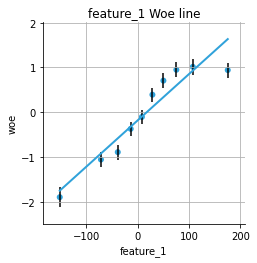

In [32]:
wl(df=df_wl, feature='feature_1', target='y', num_buck=10)

Графики похожи. Можно сделать вывод, что написанная вручную функция woe_line работает условно корректно.

## Задание 2.

1. проверить каждую переменную на woe_line,
2. каждую полезную переменную линеаризовать (для каждой переменной нужны графики ДО и ПОСЛЕ),
3. ненужные переменные (слабые по ROC AUC, немонотонные) исключить из модели,
4. на отобранных и линеаризованных переменных построить модель, проверить результат на test по ROC AUC.

### Проверка фичей на информативность и отбор только информативных фичей для построения модели.

Построим матрицу корреляции, чтобы посмотреть, есть ли зависимости между фичами:

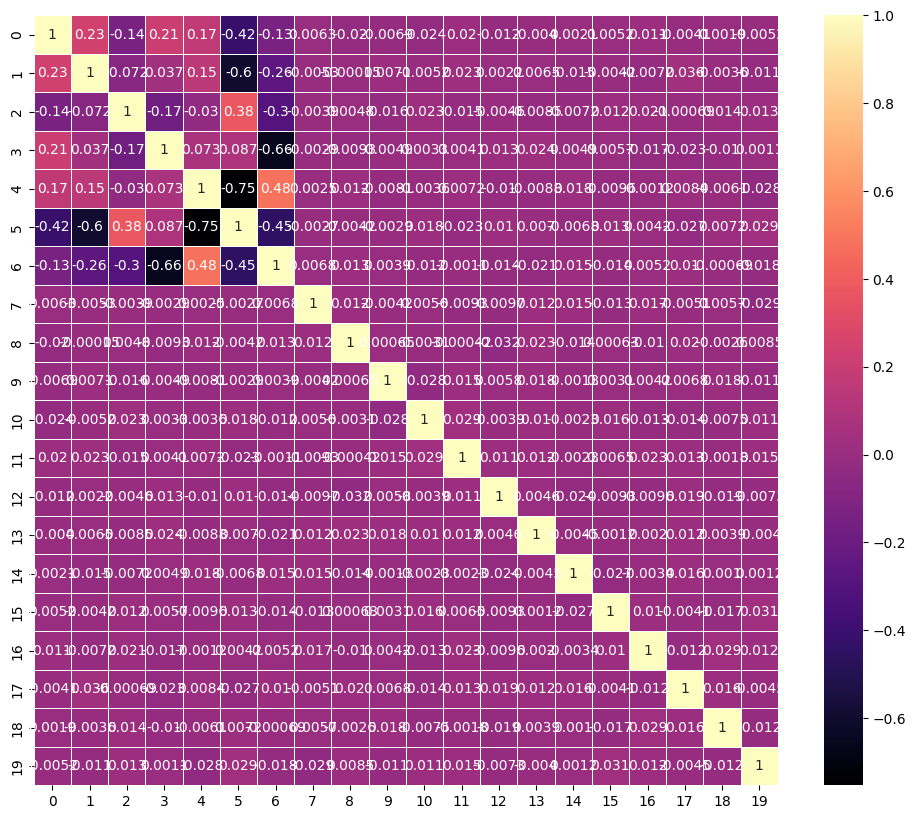

In [36]:
df = pd.DataFrame(X)
plt.figure(figsize=(12,10))
cor = df.corr()
sns.heatmap(cor, cmap="magma", annot=True, linewidth=.5)
plt.show()

Видно, что у большинства фичей сильной линейной зависимости между собой нет. Есть только зависимость у 5-ой и 6-ой по индексу с остальными (коэффициент корреляции 5-ой фичи 0.75 говорит о достаточно сильной линейной зависимости между фичами). Если на тесте информативности окажется, что 5-ая фича информативна, нужно будет дропнуть ее.

Переберем фичи и прогоним их через woe_line:

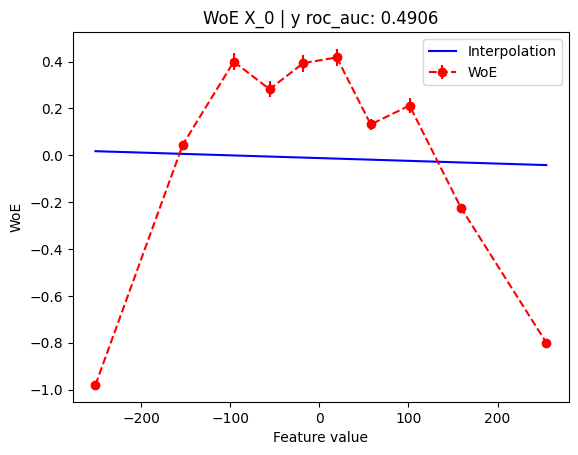


 Доверительный интервал для Bad Rate: [0.4288, 0.5698]
X_0 : auc = 0.491: non_informative_feature



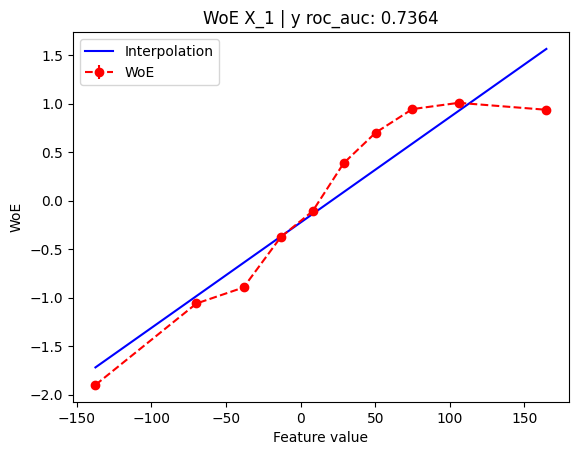


 Доверительный интервал для Bad Rate: [0.3697, 0.6289]
X_1 : auc = 0.736: informative_feature



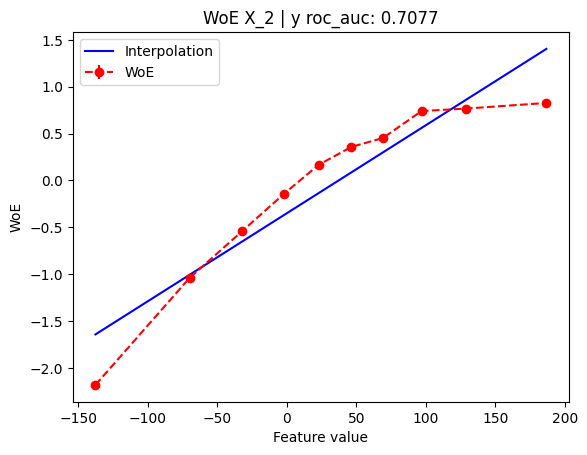


 Доверительный интервал для Bad Rate: [0.3818, 0.6168]
X_2 : auc = 0.708: informative_feature



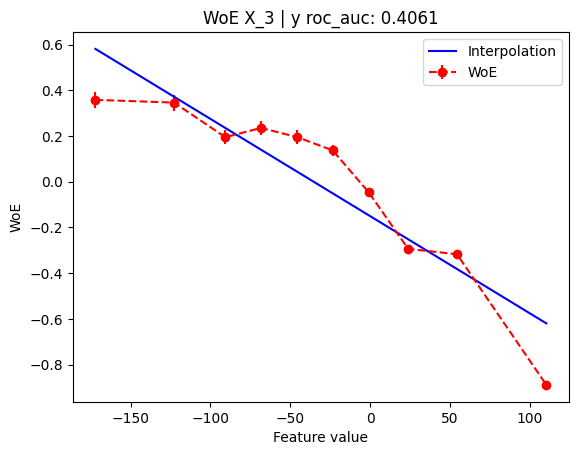


 Доверительный интервал для Bad Rate: [0.4440, 0.5546]
X_3 : auc = 0.406: informative_feature



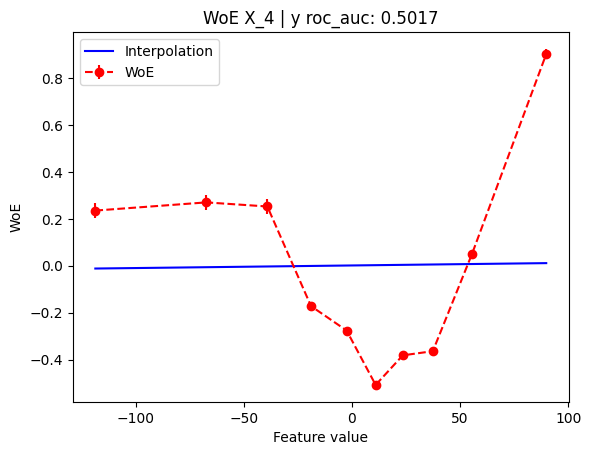


 Доверительный интервал для Bad Rate: [0.4386, 0.5599]
X_4 : auc = 0.502: non_informative_feature



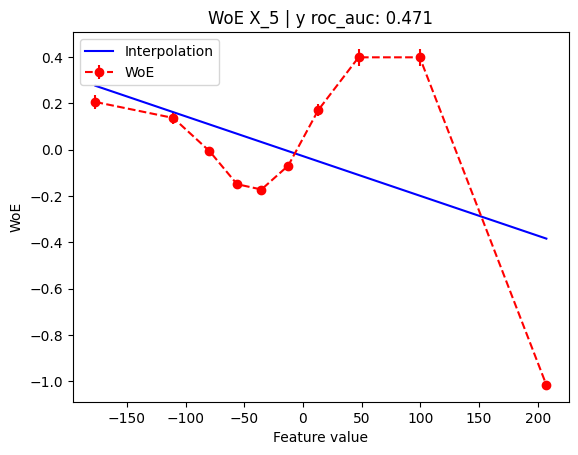


 Доверительный интервал для Bad Rate: [0.4427, 0.5559]
X_5 : auc = 0.471: informative_feature



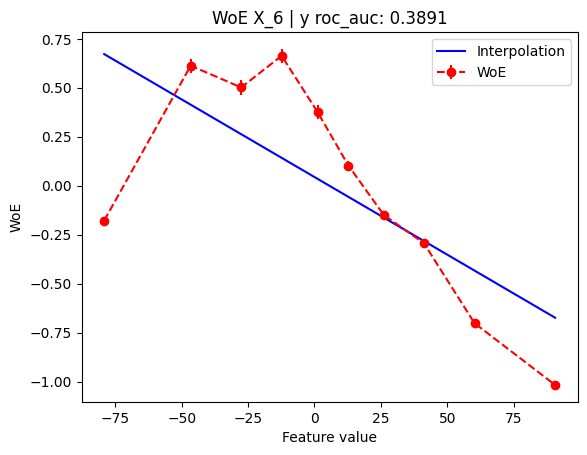


 Доверительный интервал для Bad Rate: [0.4199, 0.5787]
X_6 : auc = 0.389: informative_feature



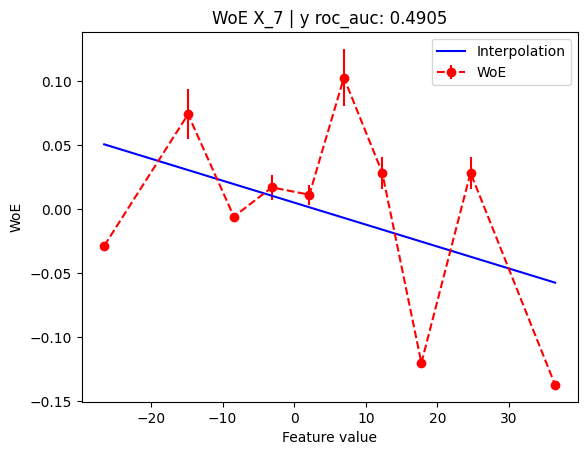


 Доверительный интервал для Bad Rate: [0.4881, 0.5105]
X_7 : auc = 0.490: non_informative_feature



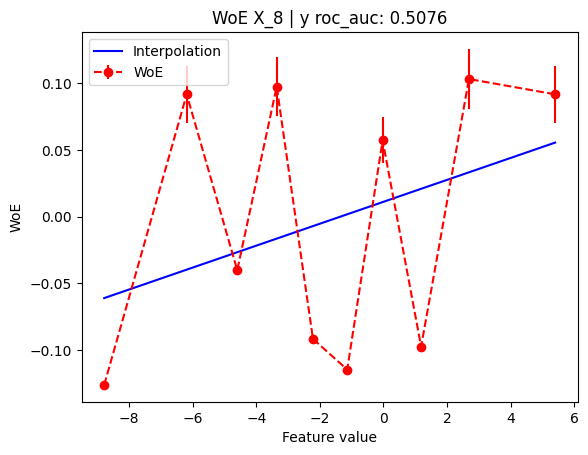


 Доверительный интервал для Bad Rate: [0.4847, 0.5138]
X_8 : auc = 0.508: non_informative_feature



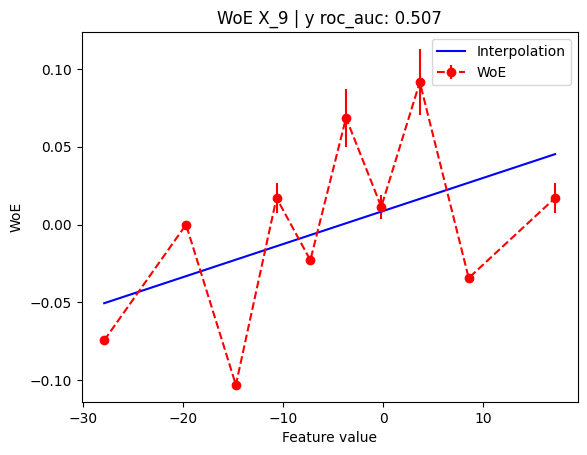


 Доверительный интервал для Bad Rate: [0.4906, 0.5080]
X_9 : auc = 0.507: non_informative_feature



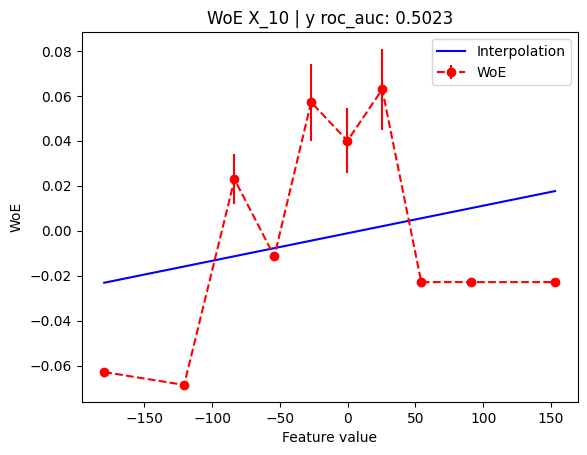


 Доверительный интервал для Bad Rate: [0.4924, 0.5061]
X_10 : auc = 0.502: non_informative_feature



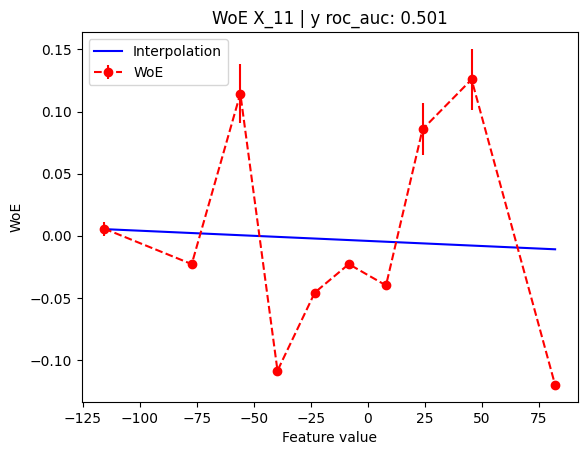


 Доверительный интервал для Bad Rate: [0.4866, 0.5120]
X_11 : auc = 0.501: non_informative_feature



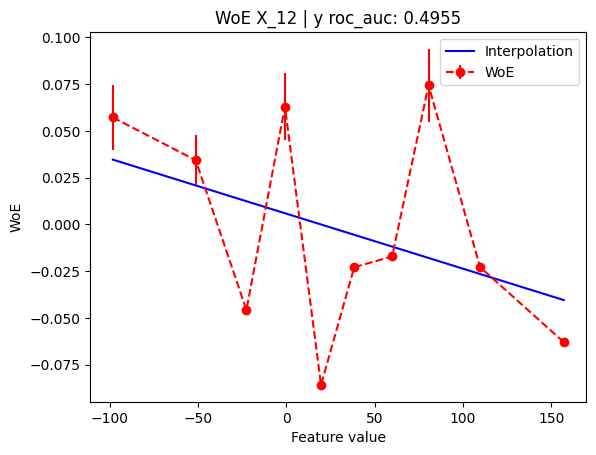


 Доверительный интервал для Bad Rate: [0.4910, 0.5076]
X_12 : auc = 0.495: non_informative_feature



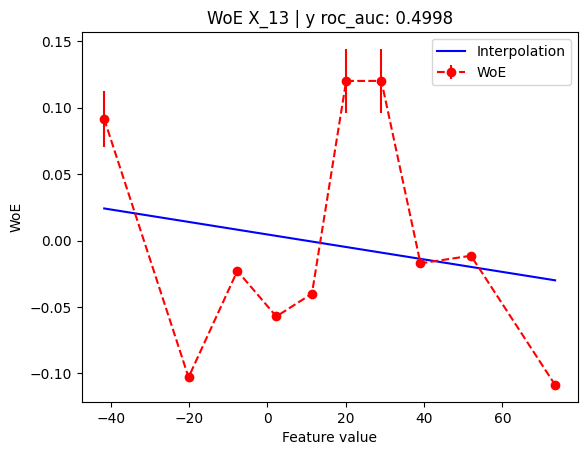


 Доверительный интервал для Bad Rate: [0.4868, 0.5118]
X_13 : auc = 0.500: non_informative_feature



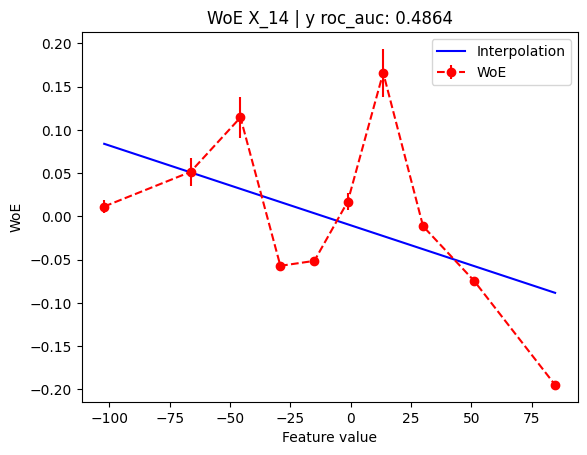


 Доверительный интервал для Bad Rate: [0.4844, 0.5142]
X_14 : auc = 0.486: non_informative_feature



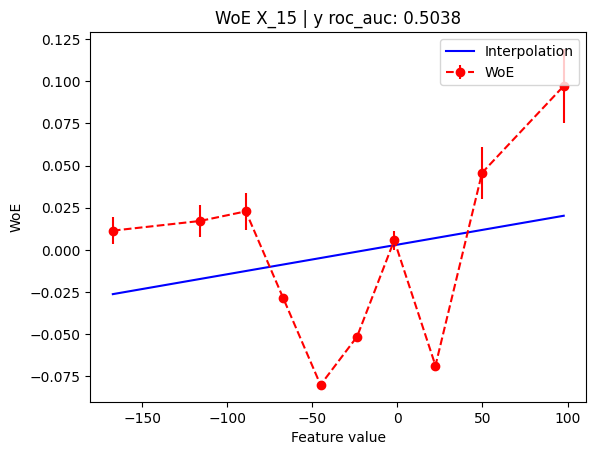


 Доверительный интервал для Bad Rate: [0.4912, 0.5073]
X_15 : auc = 0.504: non_informative_feature



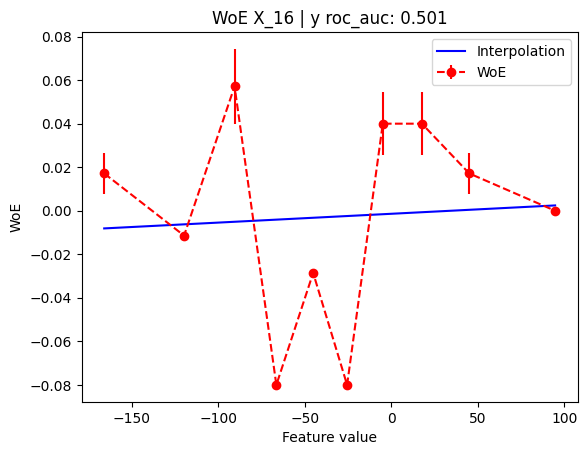


 Доверительный интервал для Bad Rate: [0.4922, 0.5063]
X_16 : auc = 0.501: non_informative_feature



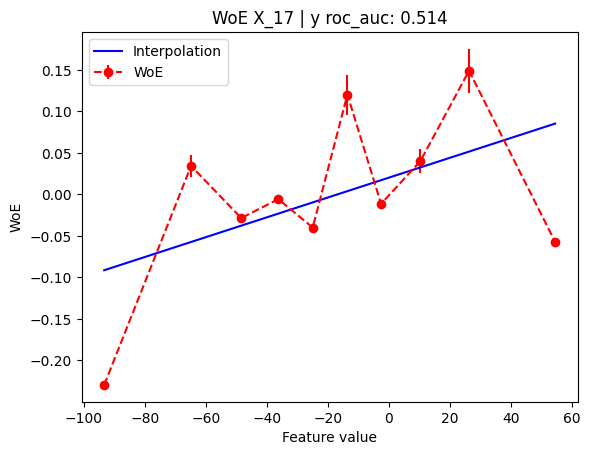


 Доверительный интервал для Bad Rate: [0.4840, 0.5146]
X_17 : auc = 0.514: non_informative_feature



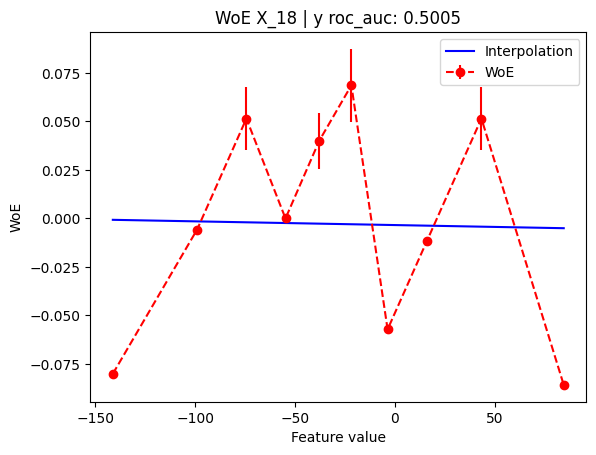


 Доверительный интервал для Bad Rate: [0.4910, 0.5076]
X_18 : auc = 0.500: non_informative_feature



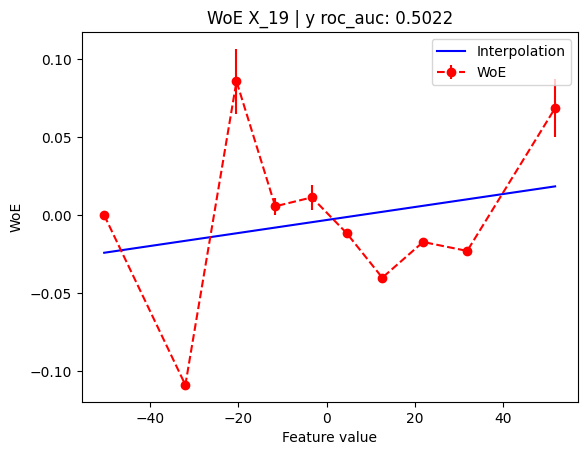


 Доверительный интервал для Bad Rate: [0.4913, 0.5073]
X_19 : auc = 0.502: non_informative_feature



In [37]:
X_informative = []
for i in range(X.shape[1]):
    var_nm = f'X_{i}'
    auc = woe_line(X=X[:, i], y=y, n_buckets=10, var_nm=var_nm, target_nm='y', plot_hist=False)
    if abs(auc - 0.5) < 0.02:
        print(f"{var_nm} : {auc = :.3f}: non_informative_feature")
    else:
        print(f"{var_nm} : {auc = :.3f}: informative_feature")
        X_informative.append(X[:, i])
    
    print('=====================================================================')
    print()
    var_nm = f'X_{i+1}'
X_informative = np.array(X_informative).transpose() # Необходимо перевернуть массив, чтобы наблюдения стали строками, а фичи - столбцами.

**! 5-ая по индексу (6-ая по счету) фича попала в список информативных, но она имеет сильную зависимость с другими фичами. Исключим ее из набора.**

Осмотрим датасет X_informative, найдем коррелируемую фичу и удалим ее.

In [38]:
X_informative

array([[-169.21189459,   89.41455746,  -78.90313074,  141.03226757,
          39.38916803],
       [  57.76047399,  -94.07359725,  -63.80591941,   49.48202976,
           3.68844241],
       [  99.32916926,  -28.68500093,   33.53362725,  -34.29344654,
         -30.06703142],
       ...,
       [ -69.88518654,  214.8991117 ,    5.67337039,   92.81037424,
         -26.05711185],
       [ -16.9345571 ,  -66.06783171,   27.33099998,  130.98417876,
         -65.10609944],
       [   3.2297287 ,  118.52921956,    1.50696182,  -80.69872085,
          -4.46230471]])

In [39]:
X_informative = np.delete(X_informative, 3, axis=1) # Коррелируемая фича в информативном датасете 4-ая по счету.

In [40]:
X_informative

array([[-169.21189459,   89.41455746,  -78.90313074,   39.38916803],
       [  57.76047399,  -94.07359725,  -63.80591941,    3.68844241],
       [  99.32916926,  -28.68500093,   33.53362725,  -30.06703142],
       ...,
       [ -69.88518654,  214.8991117 ,    5.67337039,  -26.05711185],
       [ -16.9345571 ,  -66.06783171,   27.33099998,  -65.10609944],
       [   3.2297287 ,  118.52921956,    1.50696182,   -4.46230471]])

Мы получили датасет из информативных фичей.

### Линеаризация данных (значений в фичах).

Для линеаризации данных попробуем несколько методов преобразования:


*   Прологарифмируем модуль значений фичи;
*   Возведем в квадрат значение фичи;
*   Разделим единицу на значение фичи;
*   Поменяем знак у значения фичи;
*   Извлечем корень из модуля значения фичи;
* Разделим единицу на квадрат значения фичи;
* Возведем значение фичи в куб.




Еще раз осмотрим графики woe_line для отобранных информативных фичей:

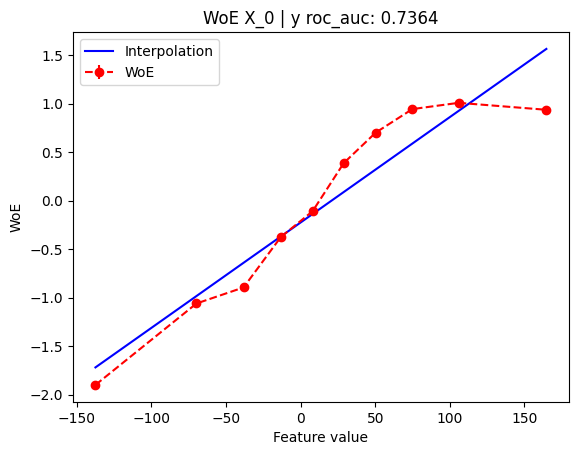


 Доверительный интервал для Bad Rate: [0.3697, 0.6289]


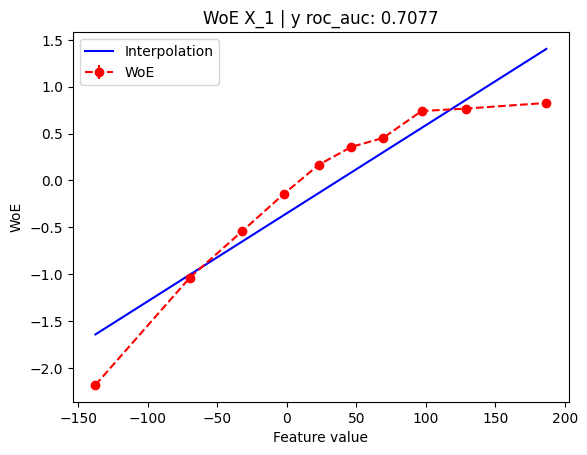


 Доверительный интервал для Bad Rate: [0.3818, 0.6168]


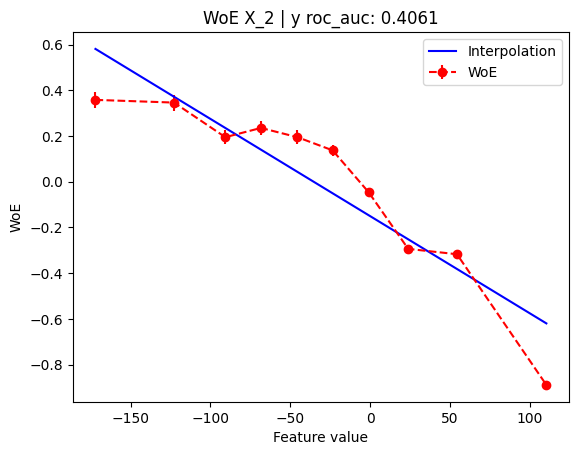


 Доверительный интервал для Bad Rate: [0.4440, 0.5546]


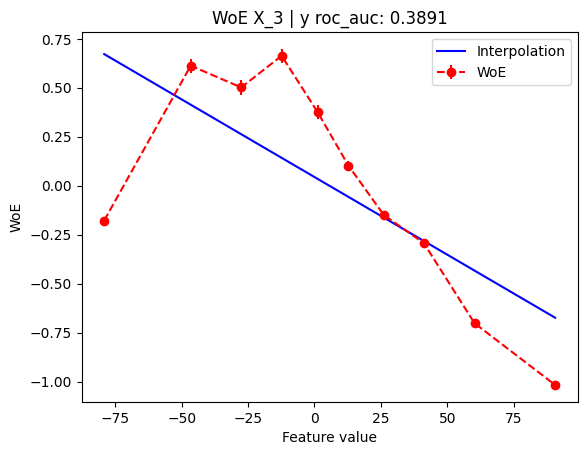


 Доверительный интервал для Bad Rate: [0.4199, 0.5787]


In [41]:
for i in range(4):
  var_nm = f'X_{i}'
  woe_line(X=X_informative[:,i], y=y, n_buckets=10, var_nm=var_nm, target_nm='y', plot_hist=False)
  var_nm = f'X_{i+1}'

Первые три графика достаточно линейны (предварительная линеаризация по вышеуказанным преобразованиям улучшений не дала, графики стали только хуже, поэтому оставлена "за кадром"). Последняя фича имеет ломаный график. Попробуем преобразование на ней.

Нелинеаризованная фича:



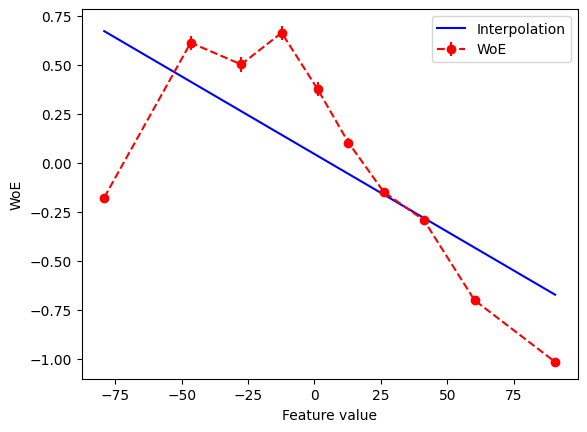


 Доверительный интервал для Bad Rate: [0.4199, 0.5787]

Перебор преобразований:

Ln(|X|)


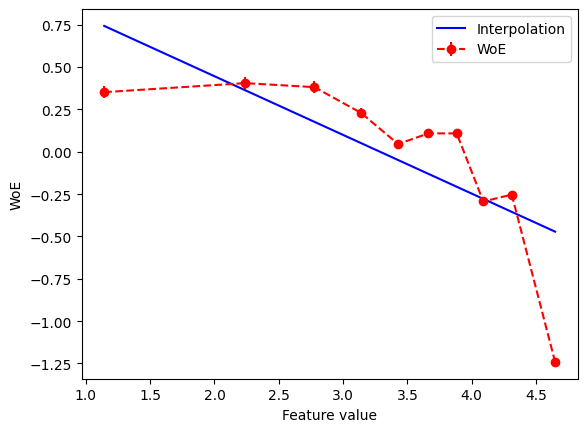


 Доверительный интервал для Bad Rate: [0.4324, 0.5662]

X^2


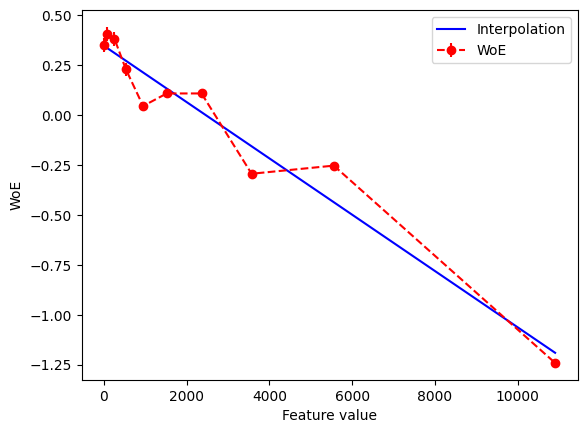


 Доверительный интервал для Bad Rate: [0.4324, 0.5662]

1/X


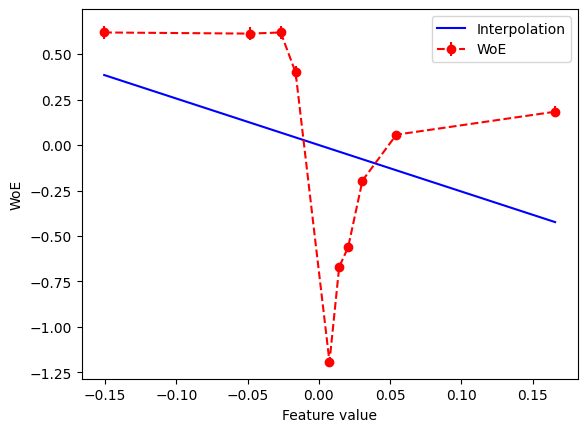


 Доверительный интервал для Bad Rate: [0.4121, 0.5864]

-X


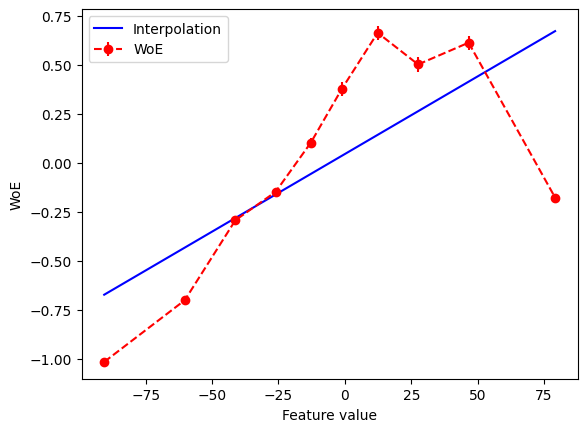


 Доверительный интервал для Bad Rate: [0.4199, 0.5787]

sqrt|X|


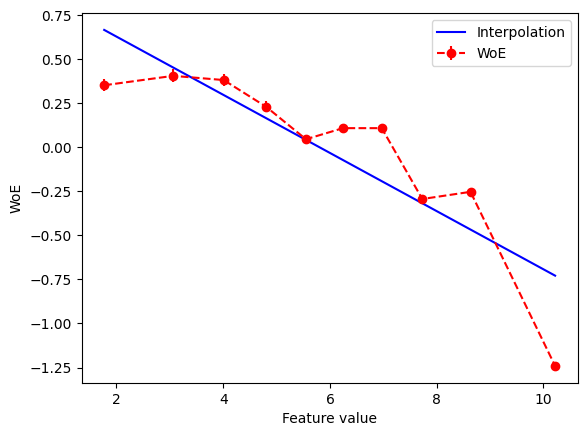


 Доверительный интервал для Bad Rate: [0.4324, 0.5662]

1/X^2


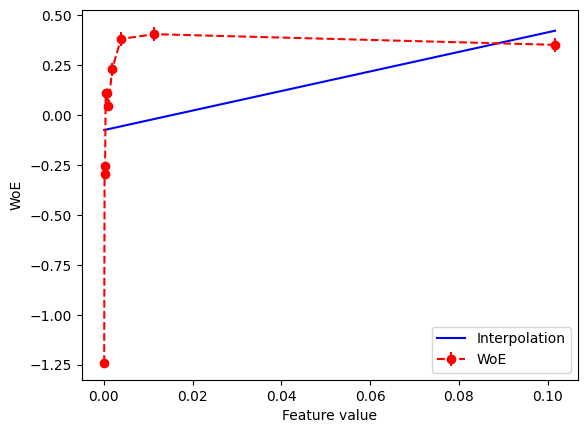


 Доверительный интервал для Bad Rate: [0.4324, 0.5662]

X^3


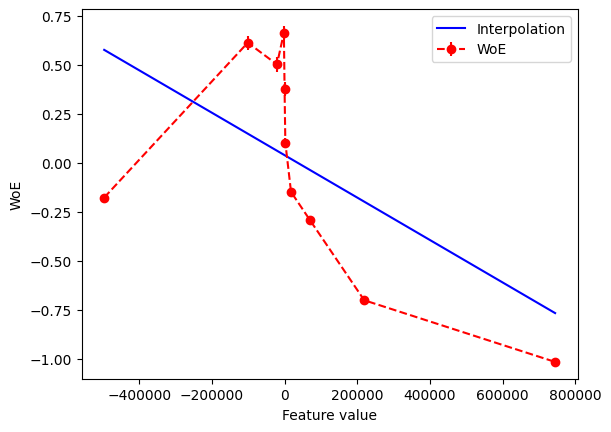


 Доверительный интервал для Bad Rate: [0.4199, 0.5787]



In [43]:
  # Логарифм модуля значения фичи
  X_log = np.log(np.abs(X_informative[:, 3]))

  # Квадрат каждого значения фичи
  X_quad = np.power(X_informative[:, 3], 2)

  # 1/значение фичи
  X_rec = np.reciprocal(X_informative[:, 3])

  # Поменять знаки у значения фичи
  X_reverse = X_informative[:, 3]*(-1)

  # Корень из модуля значения фичи
  X_sqrt = np.sqrt(np.abs(X_informative[:, 3]))

  # 1/квадрат значения фичи
  X_rec2 = np.reciprocal(np.power(X_informative[:, 3], 2))

  # Куб значения фичи
  X_3 = np.power(X_informative[:, 3], 3)

  arrays = [X_log, X_quad, X_rec, X_reverse, X_sqrt, X_rec2, X_3]
  super_array = np.array([arr for arr in arrays])

  linear_transformations = ['Ln(|X|)', 'X^2', '1/X', '-X', 'sqrt|X|', '1/X^2', 'X^3']
  
  print('Нелинеаризованная фича:\n')
  woe_line(X=X_informative[:, 3], y=y, n_buckets=10, var_nm=None, target_nm=None, plot_hist=False)
  print('=====================================================================\n')
  print('Перебор преобразований:\n')
  for array in range(7):
    print(linear_transformations[array]) 
    woe_line(X=super_array[array], y=y, n_buckets=10, var_nm=None, target_nm=None, plot_hist=False)
    print('=====================================================================\n')


По графикам видно, что возведение значений фичи в квадрат хорошо "выпрямляет" график. Применим данный тип линеаризации к фиче для дальнейшей работы с моделями.

In [44]:
X_informative

array([[-169.21189459,   89.41455746,  -78.90313074,   39.38916803],
       [  57.76047399,  -94.07359725,  -63.80591941,    3.68844241],
       [  99.32916926,  -28.68500093,   33.53362725,  -30.06703142],
       ...,
       [ -69.88518654,  214.8991117 ,    5.67337039,  -26.05711185],
       [ -16.9345571 ,  -66.06783171,   27.33099998,  -65.10609944],
       [   3.2297287 ,  118.52921956,    1.50696182,   -4.46230471]])

In [45]:
X_informative_lin = X_informative.copy() # Сохраним набор нелинеаризованных фичей для дальнейшего сравнения на ЛогРегрессии.

In [46]:
X_informative_lin

array([[-169.21189459,   89.41455746,  -78.90313074,   39.38916803],
       [  57.76047399,  -94.07359725,  -63.80591941,    3.68844241],
       [  99.32916926,  -28.68500093,   33.53362725,  -30.06703142],
       ...,
       [ -69.88518654,  214.8991117 ,    5.67337039,  -26.05711185],
       [ -16.9345571 ,  -66.06783171,   27.33099998,  -65.10609944],
       [   3.2297287 ,  118.52921956,    1.50696182,   -4.46230471]])

Возведем значения 4 фичи в квадрат.

In [47]:
X_informative_lin[:,3] = np.power(X_informative_lin[:,3],2)

In [48]:
X_informative_lin

array([[-1.69211895e+02,  8.94145575e+01, -7.89031307e+01,
         1.55150656e+03],
       [ 5.77604740e+01, -9.40735972e+01, -6.38059194e+01,
         1.36046074e+01],
       [ 9.93291693e+01, -2.86850009e+01,  3.35336272e+01,
         9.04026379e+02],
       ...,
       [-6.98851865e+01,  2.14899112e+02,  5.67337039e+00,
         6.78973078e+02],
       [-1.69345571e+01, -6.60678317e+01,  2.73310000e+01,
         4.23880418e+03],
       [ 3.22972870e+00,  1.18529220e+02,  1.50696182e+00,
         1.99121633e+01]])

Мы получили 2 датасета:
* Датасет с информативными фичами, но нелианезированный (X_informative);
* Датасет с информативными фичами, но с одной лианезированной фичей (X_infromative_lin).

### Разбивка датасета на train и test (в пропорции 70:30) и построение логистической регрессии.

Сформируем функцию для построения логистической регрессии и вывода метрики ROC AUC.

In [49]:
def log_reg(X, y, random_state, test_size):
  '''
  Функция построения модели логистической регрессии 
  с последующим выводом метрики качества модели ROC AUC.

  Аргументы функции:

  X - массив фичей (2-мерный массив);
  y - отклик (1-мерный массив);
  test_size - размер тестовой выборки;
  random_state - рандом сид для последующего воспроизведения.
  '''
  # Разбиение на тренировочную и тестовую выборки.
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

  # Построение модели.
  model = LogisticRegression()
  model.fit(X_train, y_train)

  # Прогноз на тестовой выборке.
  y_pred = model.predict(X_test)

  # Вычисление метрики ROC AUC.
  roc_auc = roc_auc_score(y_test, y_pred)
  print(f"ROC AUC: {roc_auc}")

Построим модель логистической регрессии, проверим ее работу, выведем метрики качества модели и сравним, дала ли линеаризация фичи какой-нибудь результат:

In [50]:
# Сырые данные.
print(f'Логистическая регрессия на "сырых" фичах:')
log_reg(X=X, y=y, random_state=40, test_size=0.3)

# Нелинеаризованные данные.
print(f'Логистическая регрессия на информативных нелинеаризованных фичах:')
log_reg(X=X_informative, y=y, random_state=40, test_size=0.3)

# Линеаризованные данные.
print(f'Логистическая регрессия на информативных линеаризованных фичах:')
log_reg(X=X_informative_lin, y=y, random_state=40, test_size=0.3)

Логистическая регрессия на "сырых" фичах:
ROC AUC: 0.7567359919305973
Логистическая регрессия на информативных нелинеаризованных фичах:
ROC AUC: 0.7609893000591417
Логистическая регрессия на информативных линеаризованных фичах:
ROC AUC: 0.7605675068666118


### Промежуточный вывод:
Метрика качества логистической регрессии ROC AUC в районе 0.76 это считается хорошим показателем, но модель можно и нужно улучшать. Причем парадоксально получилось, что метрика качества модели на линеаризованных данных ниже (хоть и на десятитысячные), чем на нелинеаризованных. Выходит, что не всегда данные нужно линеаризовывать.\
Посмотрим, как покажет себя случайный лес.

## Задание 3.

В этом задании предлагается сравнить алгоритм Random Forest с логистической регрессией. Обучите две модели, подобрав гиперпараметры на отделенной от трейна валидационной выборке.

 - на всех признаках из изначального датасета (на сырых данных)
 - на признаках, на которых вы строили логрег (после удаления неинформативных признаков и линеаризации остальных)

Насколько сильнее (или наоборот слабее) показали себя "деревянные модели" по сравнению с линейными? Помогла ли предобработка переменных улучшить качество случайного леса?

Напишем функцию для обучения двух моделей (ЛогРег и СлучЛес) с учетом перебора гиперпараметров. В качестве инструмента подбора лучших гиперпараметров используем GridSearchCV.

In [51]:
def lr_rf(X, y, test_size, random_state):
  '''
  Функция совместного построение двух моделей: Логистической регрессии и случайного леса
  с перебором гиперпараметров.

  Аргументы функции:

  X - массив фичей (2-мерный массив);
  y - отклик (1-мерный массив);
  test_size - размер тестовой выборки;
  random_state - рандом сид для последующего воспроизведения.
  '''
  # Разбивка на тренировочную, валидационную и тестовую выборки.
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state) # Разбиваем на тренировочную и тестовую выборки в соотношении (1-test_size)/(test_size.
  X_learn, X_val, y_learn, y_val = train_test_split(X_train, y_train, test_size=test_size, random_state=random_state) # Тренировочную разбиваем на обучающую и валидационную выборки в соотношении (1-test_size)/(test_size).

  # Установка гиперпараметров для перебора (для Логистической регрессии(lr) и для Случайного леса(rf)).
  lr_param_grid = {
    'C': [0.001, 0.01, 0.1, 1.0, 10.0],
    'penalty': ['l1', 'l2']
}
  rf_param_grid = {
    'n_estimators': [10, 50, 100, 200, 300, 400],
    'max_depth': [1, 3, 5, 10, 20]
}

  # Используем GridSearchCV для Логистической регрессии.
  lr_model = LogisticRegression(solver='liblinear', random_state=random_state)
  lr_grid = GridSearchCV(lr_model, lr_param_grid, cv=5)
  lr_grid.fit(X_learn, y_learn)

  # Используем GridSearchCV для Случайного леса.
  rf_model = RandomForestClassifier(random_state=random_state)
  rf_grid = GridSearchCV(rf_model, rf_param_grid, cv=5)
  rf_grid.fit(X_learn, y_learn)

  # Получение моделей с наилучшими параметрами.
  lr_best_model = lr_grid.best_estimator_
  rf_best_model = rf_grid.best_estimator_

  # Прогноз на валидационной выборке.
  lr_probs_val = lr_best_model.predict_proba(X_val)[:, 1]
  rf_probs_val = rf_best_model.predict_proba(X_val)[:, 1]

  # Вычисление метрики ROC AUC на валидационной выборке.
  lr_roc_auc_val = roc_auc_score(y_val, lr_probs_val)
  rf_roc_auc_val = roc_auc_score(y_val, rf_probs_val)

  # Прогноз на тестовой выборке.
  lr_probs_test = lr_best_model.predict_proba(X_test)[:, 1]
  rf_probs_test = rf_best_model.predict_proba(X_test)[:, 1]
  
  # Вычисление метрики ROC AUC на тестовой выборке.
  lr_roc_auc_test = roc_auc_score(y_test, lr_probs_test)  
  rf_roc_auc_test = roc_auc_score(y_test, rf_probs_test)

  print("Лучшая модель логистической регрессии:", lr_best_model)
  print("ROC AUC на валидационной выборке:", lr_roc_auc_val)
  print("ROC AUC на тестовой выборке:", lr_roc_auc_test)  
  print('==================================================================================')
  print("Лучшая модель случайного леса:", rf_best_model)
  print("ROC AUC на валидационной выборке:", rf_roc_auc_val)
  print("ROC AUC на тестовой выборке:", rf_roc_auc_test)  

Проверим модели на сырых данных (без отбора информативных признаков и без линеаризации):

In [52]:
lr_rf(X=X, y=y, test_size=0.3, random_state=40)

Лучшая модель логистической регрессии: LogisticRegression(C=0.1, random_state=40, solver='liblinear')
ROC AUC на валидационной выборке: 0.8221237856888997
ROC AUC на тестовой выборке: 0.8370064112565265
Лучшая модель случайного леса: RandomForestClassifier(max_depth=20, n_estimators=400, random_state=40)
ROC AUC на валидационной выборке: 0.9326538621016467
ROC AUC на тестовой выборке: 0.9310472444658919


Даже на сырых необработанных данных логистическая регрессия при переборе гиперпараметров показала метрику качества выше, чем логистическая регрессия "из коробки" на обработанных данных. ROC AUC 0.837 сырых данных против ROC AUC 0.761 на обработанных.\
Случайный лес на сырых данных показал еще более лучший результат (опираясь на метрику качества ROC AUC). **ROC AUC 0.9327** на валидационной и **ROC AUC 0.931** на тестовой выборках.

Проверим модели на отобранных информативных признаках, но без линеаризации:

In [53]:
lr_rf(X=X_informative, y=y, test_size=0.3, random_state=40)

Лучшая модель логистической регрессии: LogisticRegression(C=0.01, random_state=40, solver='liblinear')
ROC AUC на валидационной выборке: 0.8248393259092524
ROC AUC на тестовой выборке: 0.8386609290698055
Лучшая модель случайного леса: RandomForestClassifier(max_depth=10, n_estimators=400, random_state=40)
ROC AUC на валидационной выборке: 0.895839503613316
ROC AUC на тестовой выборке: 0.9008486660450131


Отобранные нелинеризованные фичи дали незначительное улучшение метрик на логистической регрессии и ухудшили показатели метрик случайного леса.

Проверим, как поведут себя модели на "подготовленных" данных: информативные и линеаризованные фичи.

In [54]:
lr_rf(X=X_informative_lin, y=y, test_size=0.3, random_state=40)

Лучшая модель логистической регрессии: LogisticRegression(C=0.1, penalty='l1', random_state=40, solver='liblinear')
ROC AUC на валидационной выборке: 0.8296003139438455
ROC AUC на тестовой выборке: 0.8414329720727554
Лучшая модель случайного леса: RandomForestClassifier(max_depth=10, n_estimators=400, random_state=40)
ROC AUC на валидационной выборке: 0.8791871519962089
ROC AUC на тестовой выборке: 0.8832349451578142


Очень интересный результат получился: с повышением уровня подготовки данных, метрика качества логистической регрессии растет, в то же время, чем "чище" данные, тем хуже метрика качества случайного леса.

### Вывод: 
* Проведя несколько тестов, мы можем ответить на вопрос: "Насколько сильнее (или наоборот слабее) показали себя "деревянные модели" по сравнению с линейными?". Случайный лес в рамках поставленной задачи справился лучше. Причем, чем более сырые данные ему подаются, тем выше метрика качества (ROC AUC) случайного леса.
* "Помогла ли предобработка переменных улучшить качество случайного леса?" - Нет. предобработка данных в рамках данного датасета только ухудшила метрику качества модели (хотя некоторые гиперпараметры модели остались неизменны). Возможно это связано с тем, что при предобработке данных теряется часть полезной (для отдельных деревьев) информации (удаление части фичей, смена знака у отрицательных значений фичи при возведении в квадрат и пр.).

## Задание 4.

В функции генерации датасета указано $n\_redundant=2$. Это значит, что две переменные получены линейной комбинацией информативных переменных.

Предыдущий анализ никак не исключает появления всех переменных в модели, для этого можно воспользоваться методами отбора признаков.

1. нужно разбить исходную выборку на 3 части: train, val, test, и попробовать подобрать коэффициент $L1$-регуляризации на валидационной выборке. Это должно убрать лишние переменные из модели и повысить таким образом ее стабильность.

Регуляризации в логистической регрессии сильно зависит от стандартного отклонения признака, поэтому стоит воспользоваться нормировкой: sklearn.preprocessing.StandardScaler

https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html

С нормировкой действуют те же правила: обучается она на train, применяется на val, test

2. подобрать коэффициент $L2$-регуляризации, чтобы избежать слишком больших коэффициентов и улучшить качество на val, test. На этом шаге использовать только те переменные, которые отобраны после п.1

Разбиваем изначальный датасет на 3 части (train, val, test).\
Поскольку перебирать несколько вариантов данных не нужно, функцию писать не требуется.

In [55]:
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.3, random_state=40)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.3, random_state=40)

Нормализуем данные (StandardScaler-ом).

In [56]:
X_test

array([[-150.34681331,  150.43250832,  109.45717644, ...,   33.3540451 ,
        -169.6140833 ,   23.75691   ],
       [-214.91631476,  -57.32678513,  -63.04563204, ...,    2.26296274,
          84.61115607,  -21.64702612],
       [-276.65815588, -241.27560255,  230.59062164, ...,  -50.05259332,
          19.58074283,   25.95901374],
       ...,
       [-135.01051031,    4.29724783, -108.90770238, ...,  -27.65410761,
          31.51953815,   -8.45148421],
       [ 146.64532219,  306.55187167,   40.35751343, ...,  -72.06576772,
         -59.48741917,  -20.55234859],
       [ 195.01651107,   -6.75750354,   -1.03273603, ...,  -54.39149314,
        -109.18548997,  -27.64682199]])

In [57]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

In [58]:
X_test_scaled

array([[-0.96519391,  1.47150311,  0.78869658, ...,  1.15576522,
        -2.06454802,  0.74999099],
       [-1.3812436 , -0.80970411, -0.92632281, ...,  0.46953638,
         1.65566968, -0.70210112],
       [-1.77907343, -2.82947113,  1.99300281, ..., -0.68514981,
         0.70404389,  0.82041787],
       ...,
       [-0.86637537, -0.13306921, -1.38228258, ..., -0.19078018,
         0.87875084, -0.28008612],
       [ 0.948457  ,  3.18570136,  0.10170914, ..., -1.17101502,
        -0.453004  , -0.66709155],
       [ 1.26013384, -0.25445092, -0.30979187, ..., -0.78091612,
        -1.18026319, -0.89398441]])

Подготовим данные для GridSerachCV (L1 и L2 регуляризации).

In [59]:
lr_l1 = LogisticRegression(penalty='l1', solver='liblinear')
param_grid_l1 = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}
grid_search_l1 = GridSearchCV(lr_l1, param_grid_l1, cv=5)
grid_search_l1.fit(X_val_scaled, y_val)
best_l1_coef = grid_search_l1.best_params_['C']

lr_l2 = LogisticRegression(penalty='l2', solver='liblinear')
param_grid_l2 = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}
grid_search_l2 = GridSearchCV(lr_l2, param_grid_l2, cv=5)
grid_search_l2.fit(X_val_scaled, y_val)
best_l2_coef = grid_search_l2.best_params_['C']

Обучение моделей на подобранных коэффициентах.

In [60]:
lr_best_l1 = LogisticRegression(penalty='l1', solver='liblinear', C=best_l1_coef)
lr_best_l1.fit(X_train_scaled, y_train)
y_pred_l1 = lr_best_l1.predict(X_test_scaled)
accuracy_l1 = accuracy_score(y_test, y_pred_l1)
roc_auc_l1 = roc_auc_score(y_test, y_pred_l1)

lr_best_l2 = LogisticRegression(penalty='l2', solver='liblinear', C=best_l2_coef)
lr_best_l2.fit(X_train_scaled, y_train)
y_pred_l2 = lr_best_l2.predict(X_test_scaled)
accuracy_l2 = accuracy_score(y_test, y_pred_l2)
roc_auc_l2 = roc_auc_score(y_test, y_pred_l2)

Выводим метрики моделей:

In [61]:
print("L1 регуляризация:")
print("Коэффициент С:", best_l1_coef)
print("Accuracy:", accuracy_l1)
print("ROC AUC Score:", roc_auc_l1)
print('=================================')
print("L2 регуляризация:")
print("Коэффициент С:", best_l2_coef)
print("Accuracy:", accuracy_l2)
print("ROC AUC Score:", roc_auc_l2)

L1 регуляризация:
Коэффициент С: 0.01
Accuracy: 0.7561904761904762
ROC AUC Score: 0.7561980922248548
L2 регуляризация:
Коэффициент С: 1
Accuracy: 0.7571428571428571
ROC AUC Score: 0.7572013250655822


Напомним, что Логистическая регрессия на "сырых" фичах без легуляризации (хотя, в sklearn по-умолчанию стоит обычно L2 легуляризация) выдала ROC AUC: 0.7567359919305973.\
При подборе коэффициентов легуляризации L1 и L2 метрики выросли незначительно, я бы даже сказал, что практически не изменились.\
И, в то же время, им очень далеко до метрик Логистической регрессии на информативных линеаризованных фичах.


## Bonus_Track

Решил попробовать прогнать пару алгоритмов в MS Azure ML studio (classic).

Сформируем датасет для последующего экспорта в .csv файл.

In [62]:
data = pd.DataFrame(X)

Добавим к фичам отклик.

In [63]:
data['y'] = y

In [64]:
data.head()

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,y
0,-46.277038,-169.211895,89.414557,-78.903131,-26.731402,141.032268,39.389168,-18.777040,-1.738580,18.501089,...,46.730170,-9.968648,36.788975,-35.089049,-128.232041,-63.039599,15.020217,108.425941,-8.573379,0
1,-222.864210,57.760474,-94.073597,-63.805919,-89.137473,49.482030,3.688442,8.395622,-1.099120,-20.040514,...,-11.053576,-39.982496,14.641007,3.610509,-93.756549,-35.361443,-27.793638,-101.637520,-14.497597,0
2,-67.434625,99.329169,-28.685001,33.533627,-11.706835,-34.293447,-30.067031,12.976128,1.401020,-8.177246,...,-41.827029,78.336703,9.791404,3.728595,77.153235,-21.595443,95.528189,72.298890,-20.124996,0
3,-184.544177,-70.074029,74.729164,30.015865,-45.854628,163.127878,-34.003829,-28.428485,6.392218,6.796828,...,14.219447,-27.856380,21.811676,40.837319,-38.775834,-74.950320,49.728842,-52.722803,51.204517,0
4,-129.439481,4.541231,-111.525376,-75.144675,-13.596824,-39.504761,58.366137,2.048067,-4.038327,6.228075,...,4.076987,77.082123,70.087053,-23.321515,-18.700076,-21.073950,91.634220,0.615705,2.390110,0


Выгружаем .csv файл на локальный компьютер.

In [65]:
file_path = '/content/data.csv'
data.to_csv(file_path, index=False)

In [66]:
from google.colab import files
files.download(file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Загружаем датасет в MS Azure ML Studio:

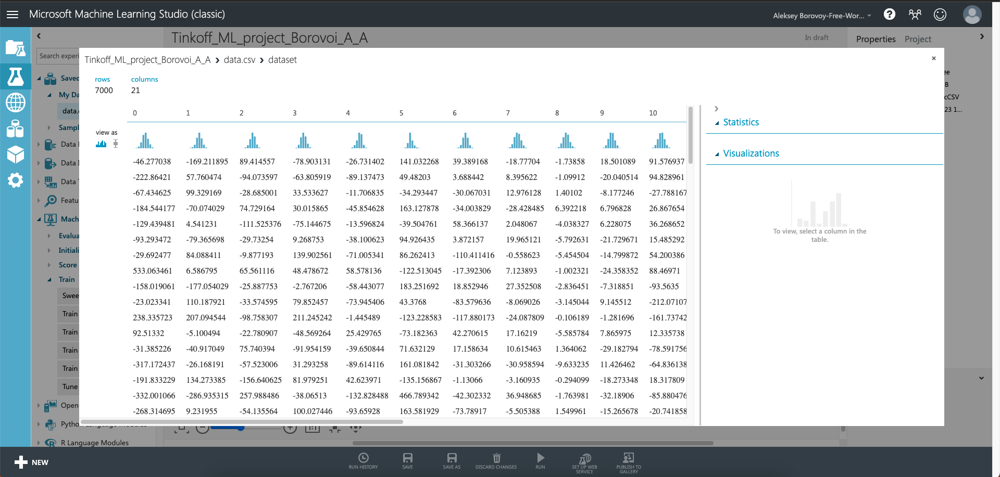

Делим датасет на train и test в пропорции 70/30.

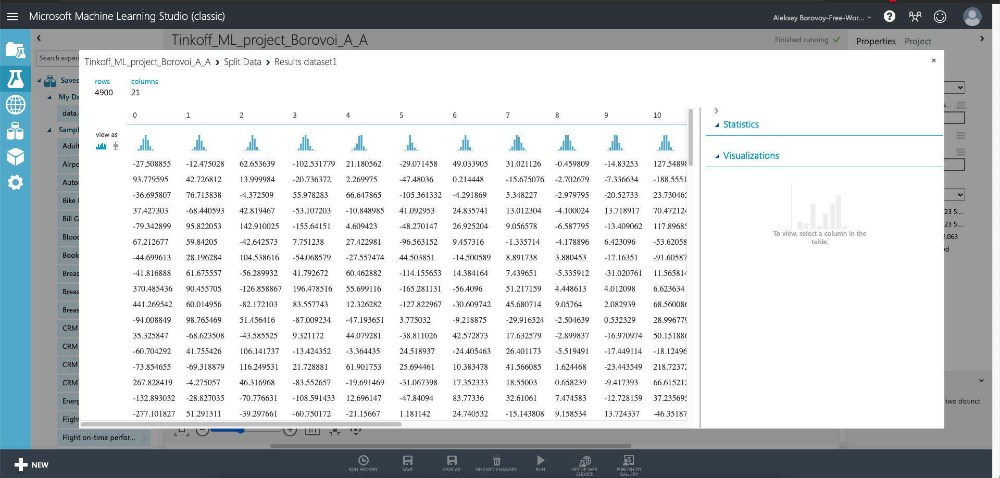

Загоняем 2-классовую логистическую регрессию обучаться на первом (train) датасете и указываем, что 'y' является откликом:

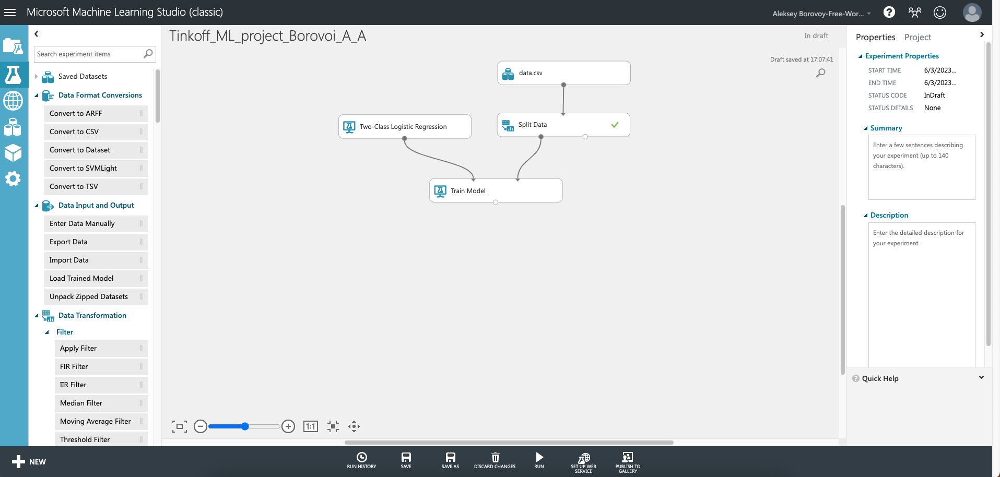

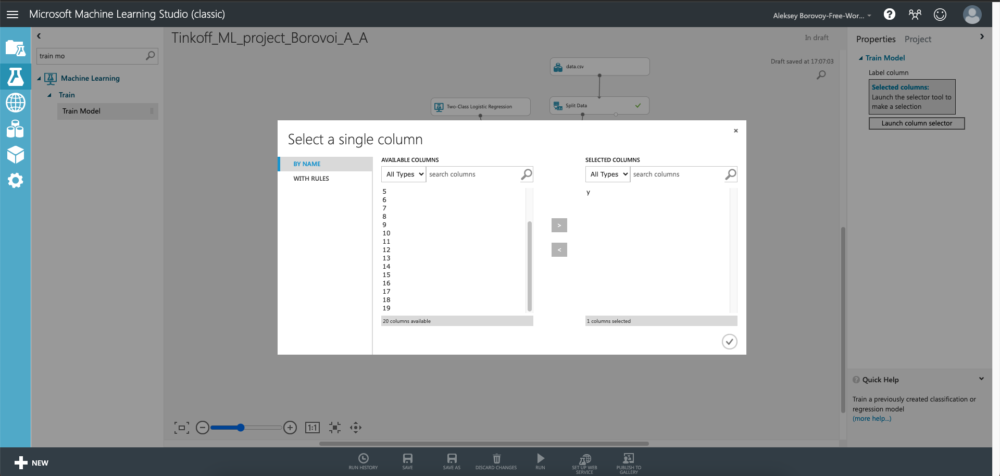

Общая схема эксперимента выглядит следующим образом:

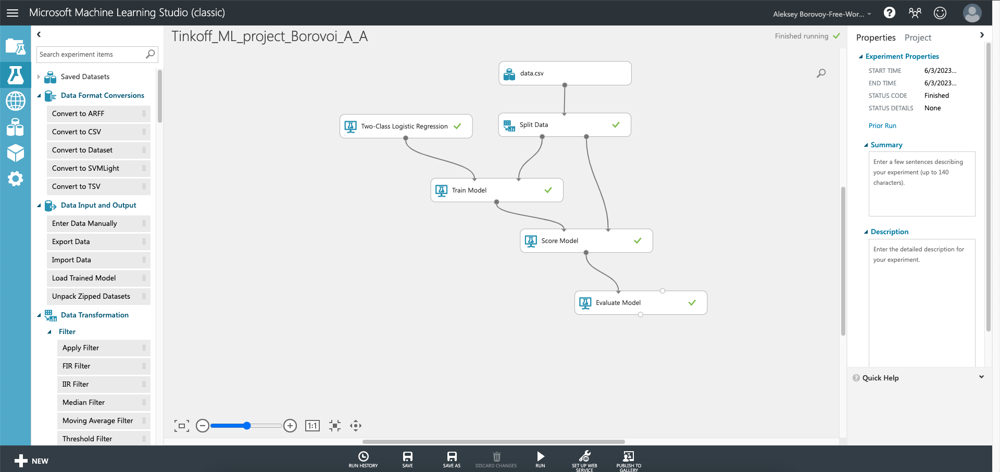

Можем посмотреть веса фичей:

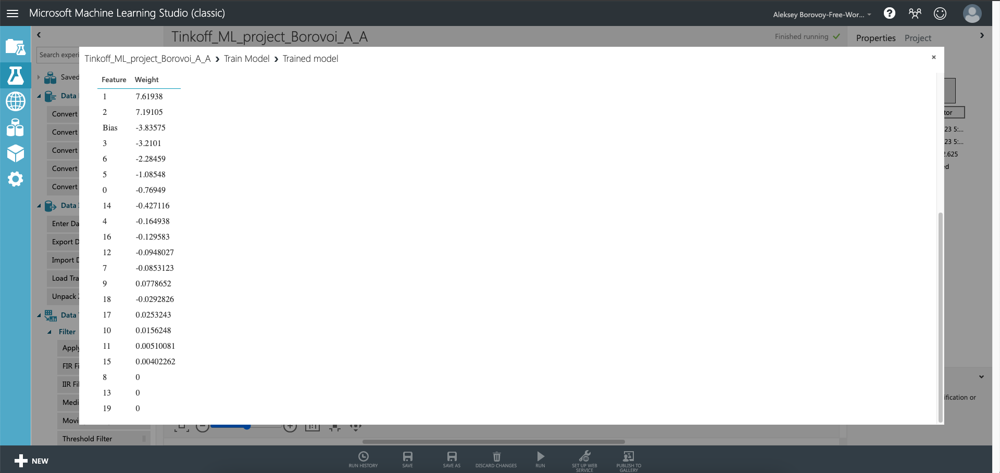

Видно, что наибольшие веса у фичей №№: 1, 2, 3, 6, 5, 0. (Примерно как у нас выше и получилось).

Можем посмотреть на результат предсказания на тестовой выборке (к какому классу модель отнесла наблюдение и с какой вероятностью).\
y - истинный класс; \
Scored Labels - предсказанный класс; \
Scored Probabilities - вероятность отнесения к 1-му классу (SP < 0.5 -> нулевой класс, SP > 0.5 -> 1 класс).

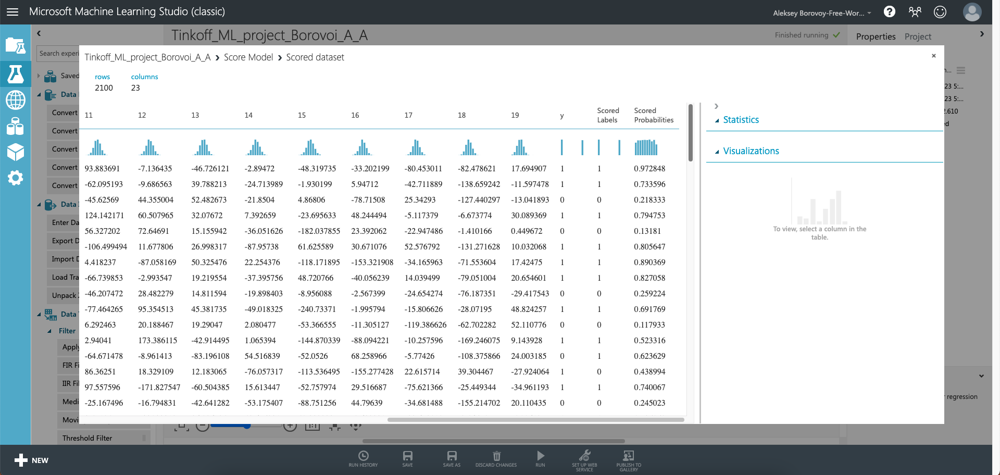

Посмотрим метрики модели (кривая ROC AUC, Accuracy, Precision, Recall, F1 Score, Матрица TP, FN, FP, TN).

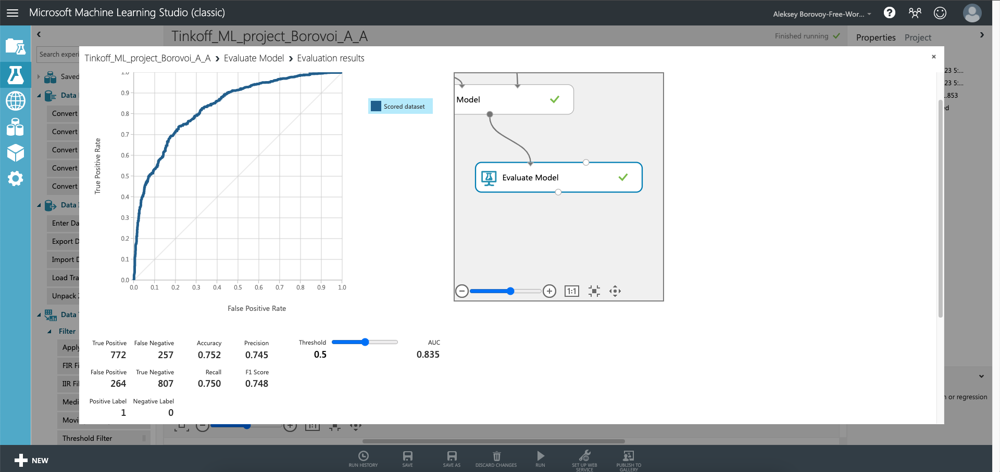

Метрики схожи с построенной выше моделью. Посмотрим, что покажет случайный лес на сырых данных.

Добавим в эксперимент ансамблевый метод - случайный лес решающих деревьев. Параметры по умолчанию возьмем из 3-ей задачи (где был перебор гиперпараметров): количество деревьев - 400, максимальная глубина - 20.

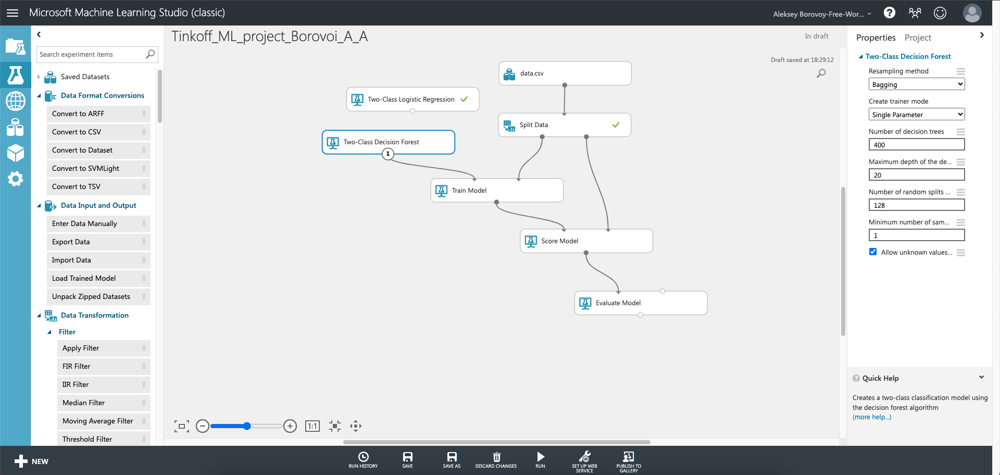

Модель обучилась и отработала на тестовой выборке. Посмотрим метрики модели.

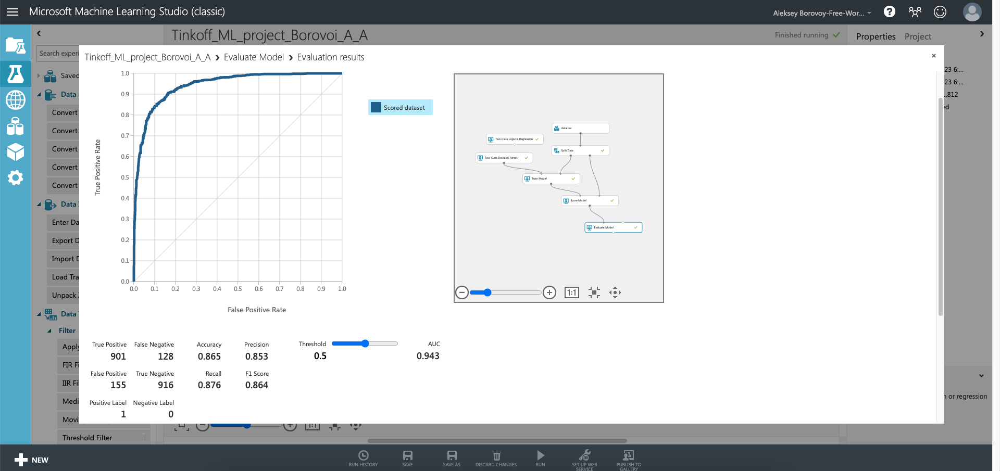

Случайный лес, как и ожидалось, показал метрики качества выше, чем логистическая регрессия.

Проверим, как поведут себя модели в MS Azure ML Studio при загрузке в них датасета с отобранными информативными линеаризованными фичами (X_informative_lin).

In [67]:
data_lin = pd.DataFrame(X_informative_lin)
data_lin.head()

,0,1,2,3
0,-169.211895,89.414557,-78.903131,1551.506558
1,57.760474,-94.073597,-63.805919,13.604607
2,99.329169,-28.685001,33.533627,904.026379
3,-70.074029,74.729164,30.015865,1156.260403
4,4.541231,-111.525376,-75.144675,3406.605895


In [68]:
data_lin['y'] = y

In [69]:
data_lin.head()

,0,1,2,3,y
0,-169.211895,89.414557,-78.903131,1551.506558,0
1,57.760474,-94.073597,-63.805919,13.604607,0
2,99.329169,-28.685001,33.533627,904.026379,0
3,-70.074029,74.729164,30.015865,1156.260403,0
4,4.541231,-111.525376,-75.144675,3406.605895,0


In [70]:
file_path = '/content/data_lin.csv'
data_lin.to_csv(file_path, index=False)

In [71]:
from google.colab import files
files.download(file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Подгружаем новый датасет и прогоняем сначала логистическую регрессию, затем случайный лес.

Проверяем, что данные подгрузились корректно.

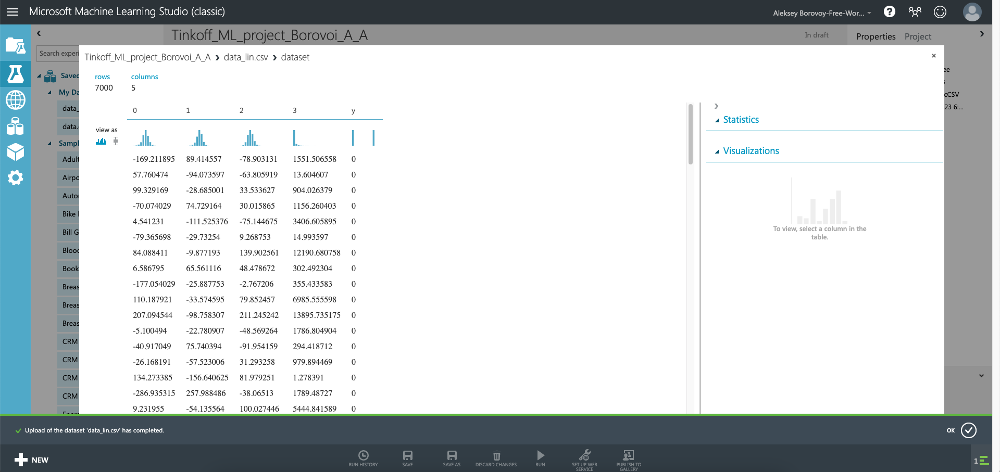

Прогоняем эксперимент на Логистической регрессии и смотрим метрики:

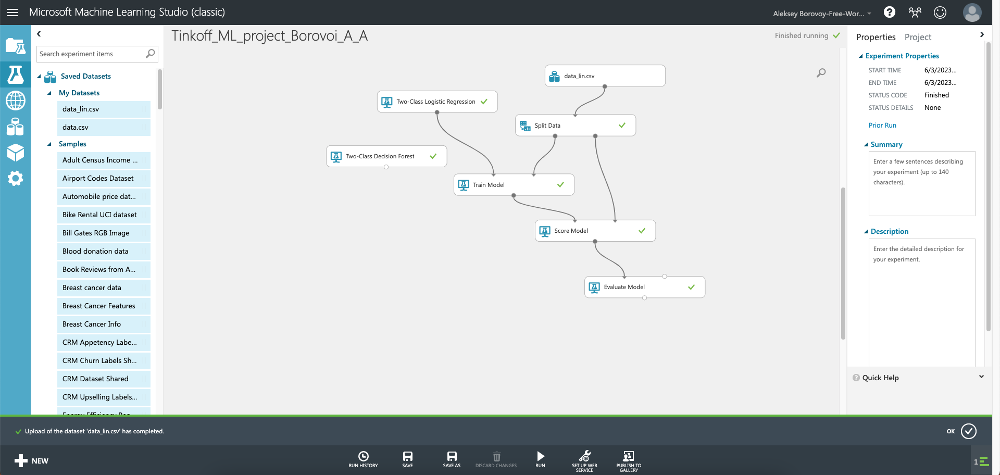

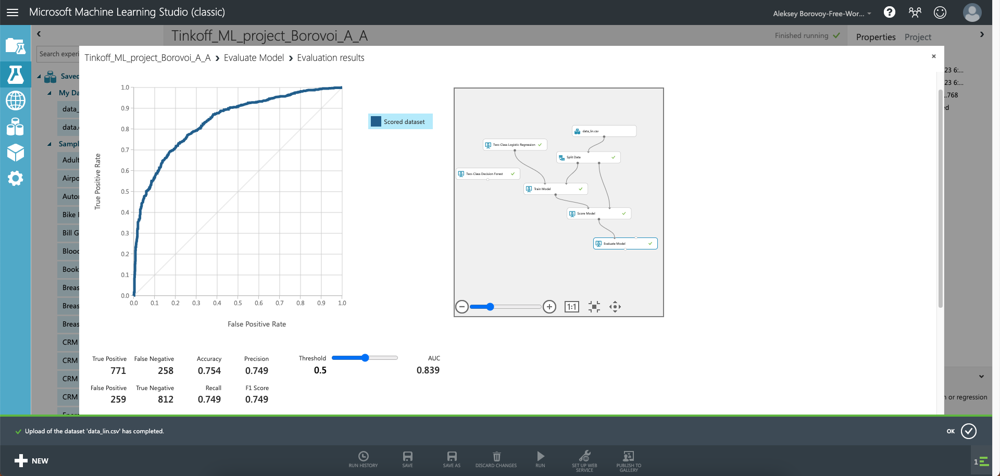

Метрики остались сопоставимы. Но и сильно лучше они не стали.\
Проверим случайный лес:

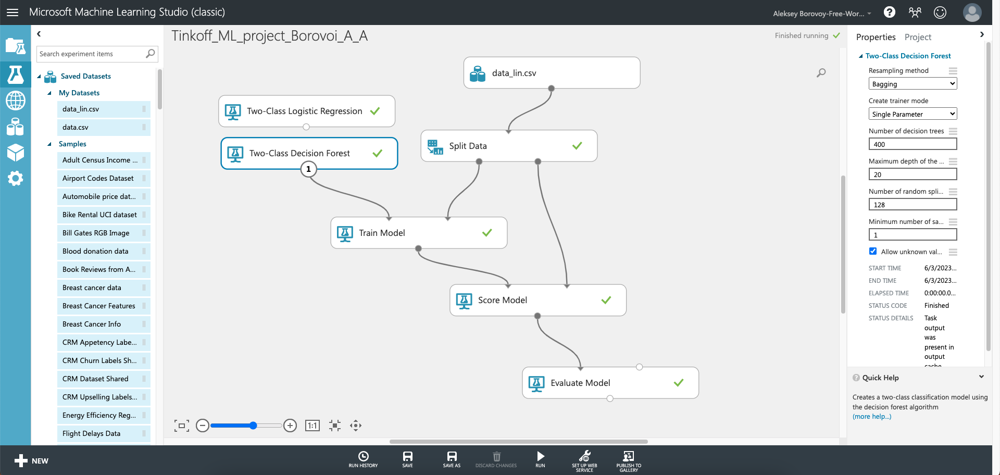

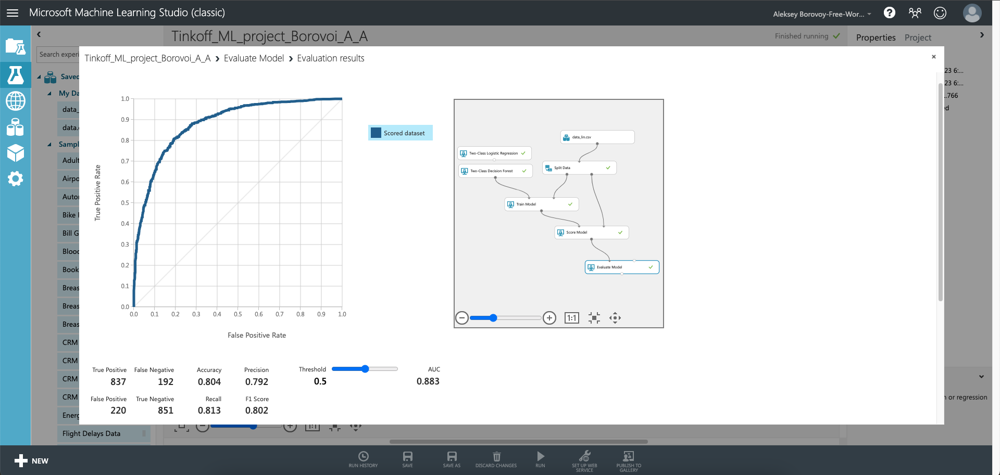

Метрики случайного леса просели значительно. Очень хорошо это заметно по очертанию кривой ROC AUC.

Вот такое NoCode решение есть для работы с моделями ML.\
Ссылка на проект:
https://gallery.cortanaintelligence.com/Experiment/Tinkoff-ML-project-Borovoi-A-A \

Причем в MS Azure ML Studio можно подбирать гиперпараметры, нормализовывать данные и т.д. \
Я хотел все это сделать, но уже отправил домашнее задание на проверку :D